In [1]:
import numpy as np
import numpy.lib.recfunctions as rfn
from os import path as osp
import glob
import cv2
import matplotlib.pyplot as plt

from retrievalnet.settings import DATA_PATH
from utils import plot_imgs
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
root = osp.join(DATA_PATH, 'datasets/nclt/')
def get_data(seq):
    im_poses = np.loadtxt(osp.join(root, 'pose_{}.csv'.format(seq)), 
                          dtype={'names': ('time', 'x', 'y', 'angle'),
                                 'formats': (np.int, np.float, np.float, np.float)},
                          delimiter=',', skiprows=1)
    return im_poses

In [3]:
def pose_distance(p1, p2):
    p1 = p1.copy().view((float, len(p1.dtype.names)))
    p2 = p2.copy().view((float, len(p2.dtype.names)))
    return np.linalg.norm(np.expand_dims(p1, axis=1) - np.expand_dims(p2, axis=0), axis=-1)
def angle_diff(a1, a2):
    return np.abs(np.mod(np.expand_dims(a1, axis=1) - np.expand_dims(a2, axis=0) + np.pi, 2*np.pi) - np.pi)

In [4]:
def generate_triplets(poses, anchor_seq, num_samples=None, 
                 thresh_distance_p=5, thresh_angle_p=np.pi/2,
                 thresh_distance_n=20, thresh_angle_n=3*np.pi/4):
    a_mask = (poses['seq'] == anchor_seq)
    if num_samples is None:
        num_samples = np.count_nonzero(a_mask)
    a_idx = np.random.choice(len(poses[a_mask]), size=num_samples)
    distance_error = pose_distance(poses[a_mask][['x', 'y']][a_idx], poses[['x', 'y']])
    angle_error = angle_diff(poses[a_mask]['angle'][a_idx], poses['angle'])
    
    # compute candidates for positive elements
    p_mask = np.logical_not(a_mask)
    p_matches = np.logical_and(distance_error < thresh_distance_p, angle_error < thresh_angle_p)[:, p_mask]

    # filter out when no match
    has_match = np.any(p_matches, axis=1)
    p_matches = p_matches[has_match]
    a_idx = a_idx[has_match]
    
    # samples positive elements
    p_idx = [np.where(m)[0] for m in p_matches]
    
    # compute candidates for negative elements and samples (assume there's always a match)
    n_mask = a_mask
    n_matches = np.logical_or(distance_error > thresh_distance_n, angle_error > thresh_angle_n)[has_match][:, n_mask]
    n_idx = [np.random.choice(np.where(m)[0], size=len(i)) for m, i in zip(n_matches, p_idx)]
    
    # flatten indices
    a_idx = np.repeat(a_idx, [len(i) for i in p_idx])
    p_idx = np.concatenate(p_idx)
    n_idx = np.concatenate(n_idx)
    
    # gather
    a_poses = poses[a_mask][a_idx]
    p_poses = poses[p_mask][p_idx]
    n_poses = poses[n_mask][n_idx]
    t = rfn.merge_arrays([v[['seq', 'time']] for v in [a_poses, p_poses, n_poses]])
    t.dtype.names = ('a', 'p', 'n')
    return t

In [5]:
seqs = ['2012-01-22', '2012-03-31', '2012-11-04', '2013-04-05']
poses = []
for s in seqs:
    d = get_data(s)
    poses.append(rfn.append_fields(d, 'seq', [s]*len(d), usemask=False))
poses = rfn.stack_arrays(poses, usemask=False)

In [6]:
triplets = []
for s in seqs:
    triplets.append(generate_triplets(poses, s))
triplets = rfn.stack_arrays(triplets, usemask=False)
np.random.shuffle(triplets)
print('Number of generated triplets: {}'.format(len(triplets)))

Number of generated triplets: 14052


In [7]:
def imread(seq, name, camera=4):
    im = cv2.imread(osp.join(root, '{}/lb3/Cam{}/{}.tiff'.format(seq, camera, name)))
    return np.rot90(im, k=3)

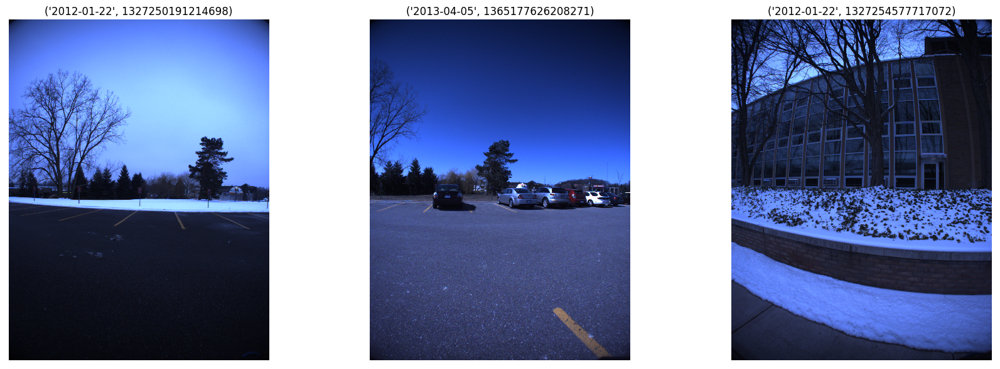

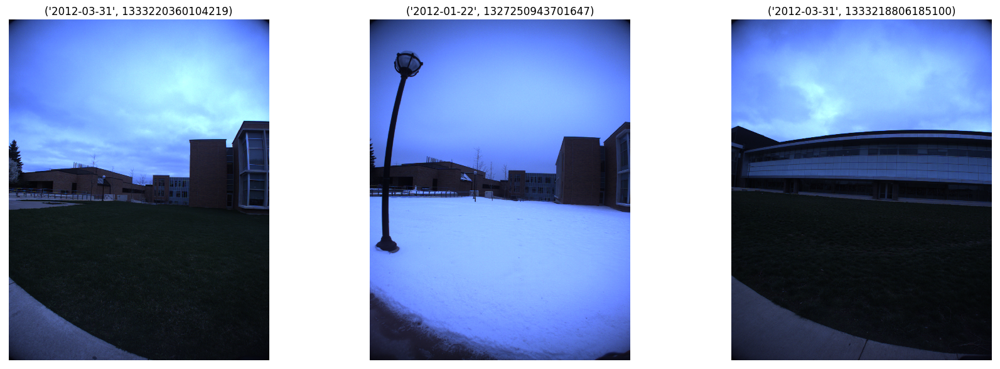

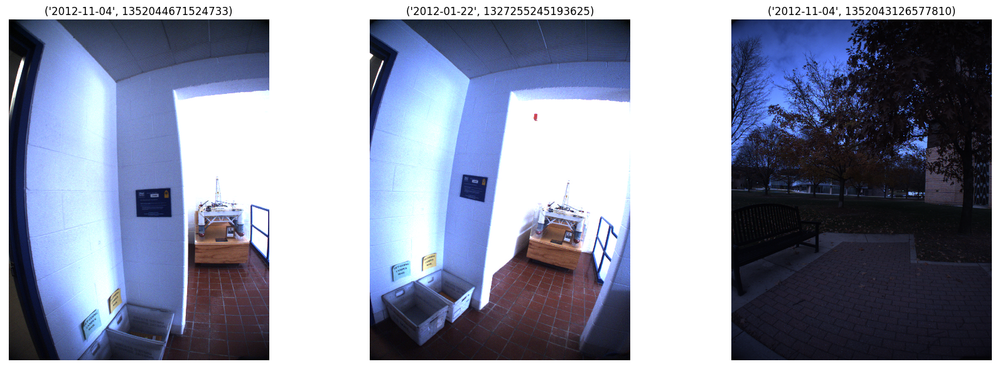

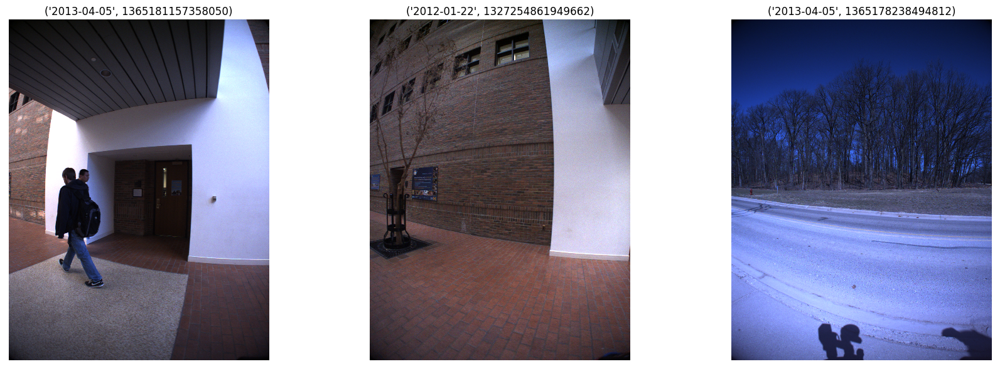

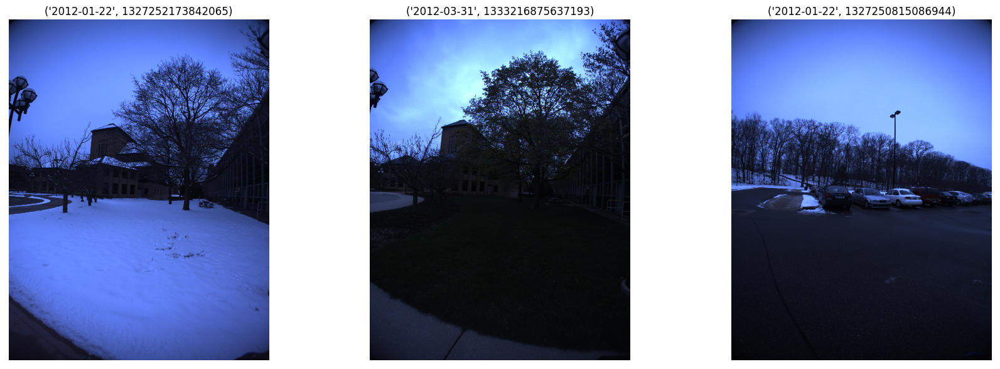

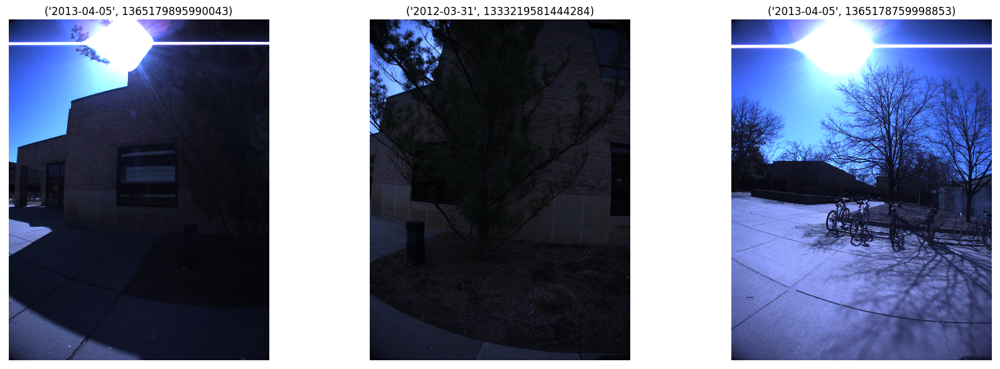

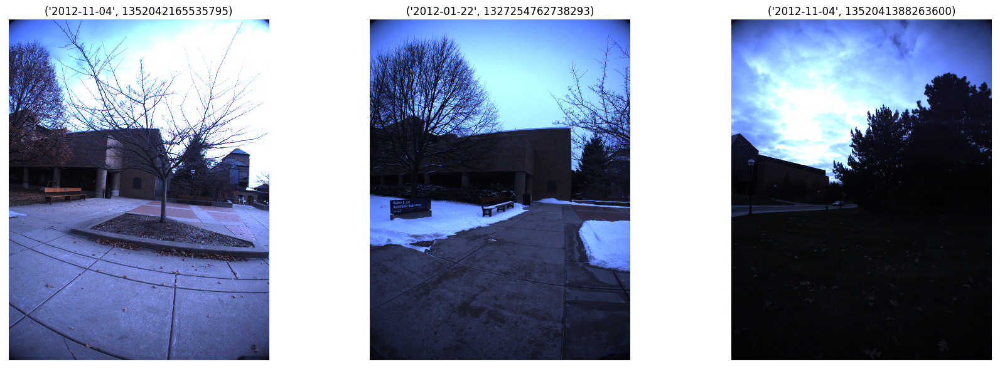

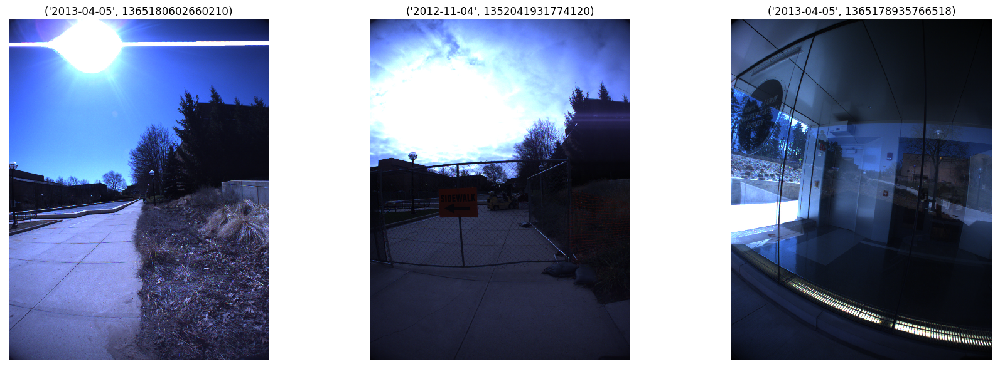

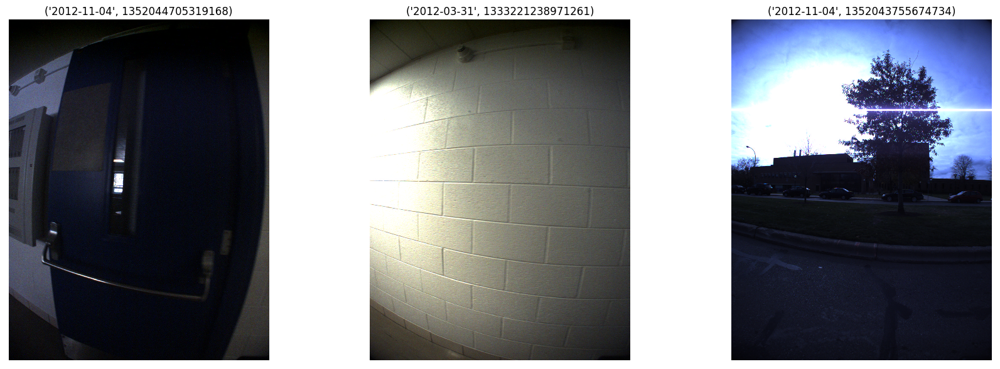

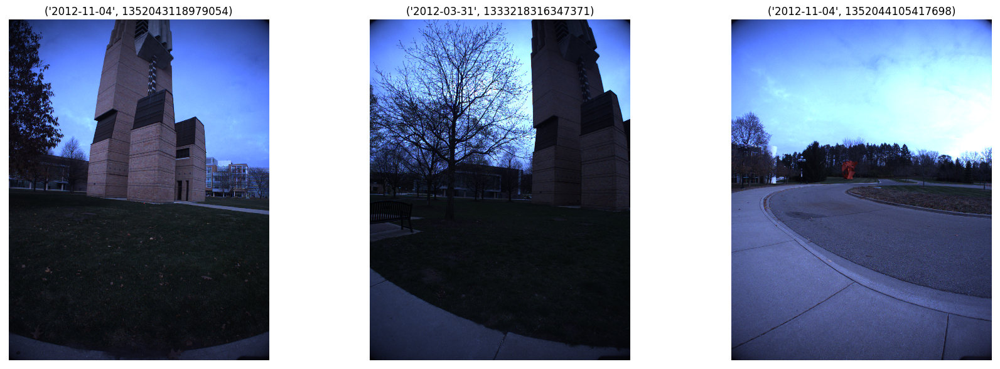

In [8]:
for i in range(10):
    plot_imgs([imread(*triplets[e][i]) for e in ['a', 'p', 'n']], titles=triplets[i])

In [9]:
np.save(osp.join(root, 'triplets_3seqs.npy'), triplets)